In [1]:
import numpy as np
import pandas as pd
import warnings #to remove the warning errors
from pandas_profiling import ProfileReport

In [2]:
car_p = pd.read_csv('CarPrice_data.csv')

In [3]:
car_p.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In This section we examine the data. We found out that it is consist of 205 rows, 26 columns. 8 columns are float type of data,
8 columns are integer type of data and 10 columns are objects type of data. No duplicate rows and non of the rows content null
values

In [4]:
car_p.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

In [5]:
car_p.isnull().sum() #finding the total null values per columns

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

In [6]:
#assessing the dataset for data duplicates
dup = car_p[car_p.duplicated()]

In [7]:
dup

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price


In [8]:
#change the car insurance symboling to categorical
car_p["symboling"] = car_p['symboling'].astype('str')

In [9]:
# A general overview of the whole data set
rep_prof=ProfileReport(car_p)
rep_prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# EXPLORATTORY DATA ANALYSIS

# 1. Univeriate data Analysis

In the univariate analysis, we examine the data variables one after another by using barcharts, measures of central tendencies.
This is the simpliest form of statistical data analysis. It reveals clearly the characteristics of each distribution. Here,
the Car_ID feature was not considered as variable.

In [10]:
# we firstly described the numeric data
car_p.describe().T

,count,mean,std,min,25%,50%,75%,max
car_ID,205.0,103.000000,59.322565,1.00,52.00,103.00,154.00,205.00
wheelbase,205.0,98.756585,6.021776,86.60,94.50,97.00,102.40,120.90
carlength,205.0,174.049268,12.337289,141.10,166.30,173.20,183.10,208.10
carwidth,205.0,65.907805,2.145204,60.30,64.10,65.50,66.90,72.30
carheight,205.0,53.724878,2.443522,47.80,52.00,54.10,55.50,59.80
curbweight,205.0,2555.565854,520.680204,1488.00,2145.00,2414.00,2935.00,4066.00
enginesize,205.0,126.907317,41.642693,61.00,97.00,120.00,141.00,326.00
boreratio,205.0,3.329756,0.270844,2.54,3.15,3.31,3.58,3.94
stroke,205.0,3.255415,0.313597,2.07,3.11,3.29,3.41,4.17
compressionratio,205.0,10.142537,3.972040,7.00,8.60,9.00,9.40,23.00


In [11]:
# import the visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# symboling

In [12]:
# describing the insurance symboling
car_p['symboling'].describe()

count     205
unique      6
top         0
freq       67
Name: symboling, dtype: object

[Text(0.5, 1.0, 'Car insurance Symboling')]

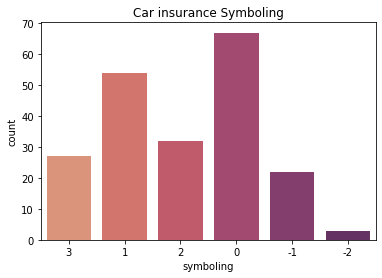

In [13]:
sns.countplot(x='symboling',data=car_p, palette='flare', ).set(title='Car insurance Symboling')

# count of cars by names

In [14]:
# we consider the most first 30 selling cars of the dataset, since most of the cars sample appear once
cr_name = car_p.groupby(['CarName'])['CarName'].count().nlargest(20)
print(cr_name)
print('_________________________')
print('CAR NAME AND DESCRIPTION')
print('_________________________')
print(car_p['CarName'].describe())

CarName
peugeot 504             6
toyota corolla          6
toyota corona           6
subaru dl               4
honda civic             3
mazda 626               3
mitsubishi g4           3
mitsubishi mirage g4    3
mitsubishi outlander    3
toyota mark ii          3
audi 100ls              2
bmw 320i                2
bmw x3                  2
honda accord            2
honda civic cvcc        2
isuzu D-Max             2
mazda glc               2
mazda glc deluxe        2
mazda rx-4              2
mazda rx-7 gs           2
Name: CarName, dtype: int64
_________________________
CAR NAME AND DESCRIPTION
_________________________
count             205
unique            147
top       peugeot 504
freq                6
Name: CarName, dtype: object


<AxesSubplot:title={'center':'FIRST 30 MOST SELLING CARS BY NAMES'}, xlabel='CarName'>

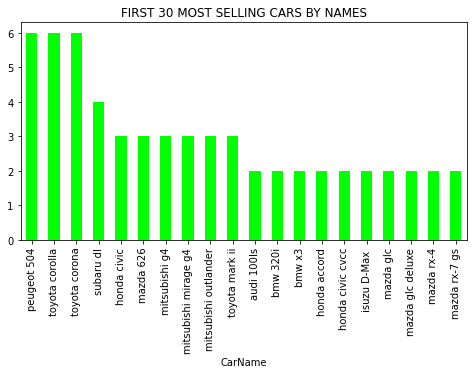

In [15]:
cr_name.plot(kind='bar',title='FIRST 30 MOST SELLING CARS BY NAMES',color='lime',figsize=[8,4])

# fueltype 

In [16]:
fuel = car_p.groupby(['fueltype'])['fueltype'].count()
print(fuel)

fueltype
diesel     20
gas       185
Name: fueltype, dtype: int64


<AxesSubplot:title={'center':'NUMBER OF CARS BY TYPE OF FUEL THEY USE'}, xlabel='fueltype'>

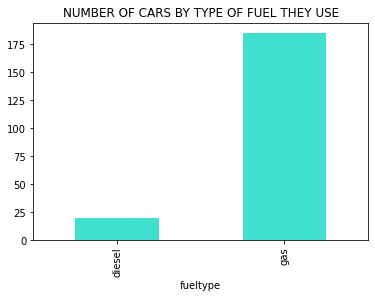

In [17]:
fuel.plot(kind='bar',figsize=[6,4],title='NUMBER OF CARS BY TYPE OF FUEL THEY USE',color='turquoise')

# aspiration

In [18]:
aspr= car_p.groupby(['aspiration'])['aspiration'].count()
print(aspr)

aspiration
std      168
turbo     37
Name: aspiration, dtype: int64


<AxesSubplot:title={'center':'NUMBER OF CARS BY ASPIRATION'}, xlabel='aspiration'>

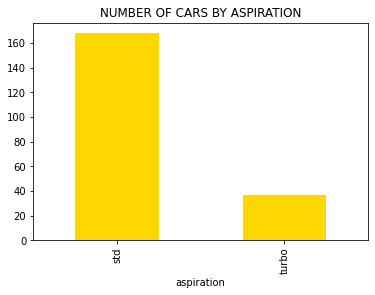

In [19]:
aspr.plot(kind='bar', color='gold',figsize=[6,4], title='NUMBER OF CARS BY ASPIRATION')

# doornumber

In [20]:
do_num= car_p.groupby(['doornumber'])['doornumber'].count()
print(do_num)

doornumber
four    115
two      90
Name: doornumber, dtype: int64


<AxesSubplot:title={'center':'CAR COUNT BY NUMBER OF DOORS'}, xlabel='doornumber'>

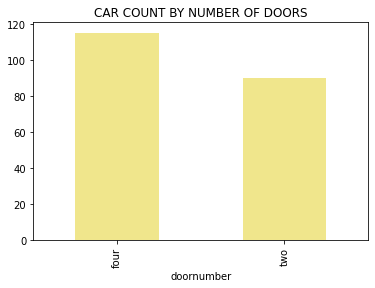

In [21]:
do_num.plot(kind='bar',color='khaki',figsize=[6,4],title='CAR COUNT BY NUMBER OF DOORS')

# carbody

In [22]:
carbody= car_p.groupby(['carbody'])['carbody'].count()
print(carbody)

carbody
convertible     6
hardtop         8
hatchback      70
sedan          96
wagon          25
Name: carbody, dtype: int64


<AxesSubplot:title={'center':'CAR COUNT BY BODY TYPE'}, xlabel='carbody'>

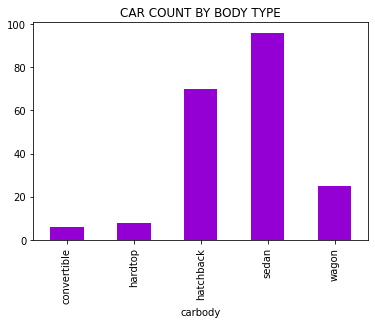

In [23]:
carbody.plot(kind='bar',color='darkviolet',figsize=[6,4],title='CAR COUNT BY BODY TYPE')

# drivewheel

In [24]:
drive= car_p.groupby(['drivewheel'])['drivewheel'].count()
print(drive)

drivewheel
4wd      9
fwd    120
rwd     76
Name: drivewheel, dtype: int64


<AxesSubplot:title={'center':'CAR COUNT BY WHEELDRIVE'}, xlabel='drivewheel'>

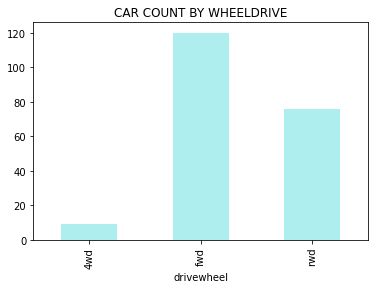

In [25]:
drive.plot(kind='bar',color='paleturquoise',figsize=[6,4],title='CAR COUNT BY WHEELDRIVE')

# enginelocation

In [26]:
eng_loc= car_p.groupby(['enginelocation'])['enginelocation'].count()
print(eng_loc)

enginelocation
front    202
rear       3
Name: enginelocation, dtype: int64


<AxesSubplot:title={'center':'CAR COUNT BY ENGINE LOCATION'}, xlabel='enginelocation'>

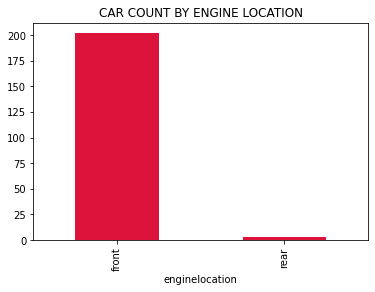

In [27]:
eng_loc.plot(kind='bar',color='crimson',figsize=[6,4],title='CAR COUNT BY ENGINE LOCATION')

# wheelbase

In [28]:
car_p['wheelbase'].describe()

count    205.000000
mean      98.756585
std        6.021776
min       86.600000
25%       94.500000
50%       97.000000
75%      102.400000
max      120.900000
Name: wheelbase, dtype: float64

<AxesSubplot:title={'center':'CAR COUNT BY WHEELBASE'}, ylabel='Frequency'>

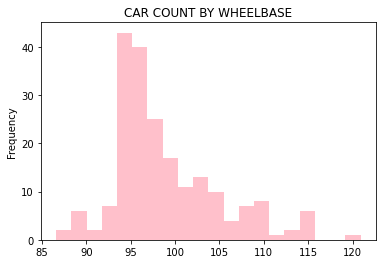

In [29]:
car_p['wheelbase'].plot(kind='hist',color='pink',figsize=[6,4],title='CAR COUNT BY WHEELBASE', bins=20)

# carlength

In [30]:
car_p['carlength'].describe()

count    205.000000
mean     174.049268
std       12.337289
min      141.100000
25%      166.300000
50%      173.200000
75%      183.100000
max      208.100000
Name: carlength, dtype: float64

<AxesSubplot:title={'center':'CAR COUNT BY LENGTH'}, ylabel='Frequency'>

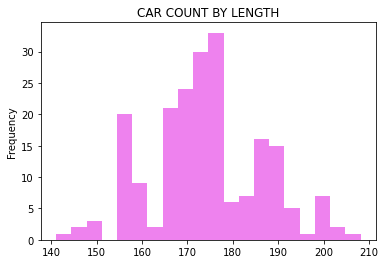

In [31]:
car_p['carlength'].plot(kind='hist',color='violet',figsize=[6,4],title='CAR COUNT BY LENGTH', bins=20)

# carwidth

In [32]:
car_p['carwidth'].describe()

count    205.000000
mean      65.907805
std        2.145204
min       60.300000
25%       64.100000
50%       65.500000
75%       66.900000
max       72.300000
Name: carwidth, dtype: float64

<AxesSubplot:title={'center':'CAR COUNT BY WIDTH'}, ylabel='Frequency'>

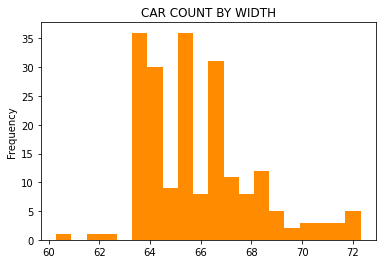

In [33]:
car_p['carwidth'].plot(kind='hist',color='darkorange',figsize=[6,4],title='CAR COUNT BY WIDTH', bins=20)

# carheight

In [34]:
car_p['carheight'].describe()

count    205.000000
mean      53.724878
std        2.443522
min       47.800000
25%       52.000000
50%       54.100000
75%       55.500000
max       59.800000
Name: carheight, dtype: float64

<AxesSubplot:title={'center':'CAR COUNT BY HEIGHT'}, ylabel='Frequency'>

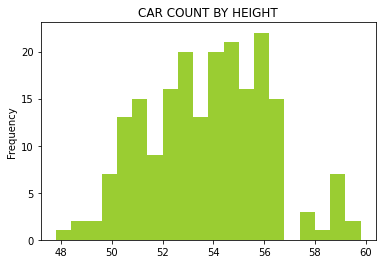

In [35]:
car_p['carheight'].plot(kind='hist',color='yellowgreen',figsize=[6,4],title='CAR COUNT BY HEIGHT', bins=20)

# curbweight

In [36]:
car_p['curbweight'].describe()

count     205.000000
mean     2555.565854
std       520.680204
min      1488.000000
25%      2145.000000
50%      2414.000000
75%      2935.000000
max      4066.000000
Name: curbweight, dtype: float64

<AxesSubplot:title={'center':'CAR COUNT BY WEIGHT'}, ylabel='Frequency'>

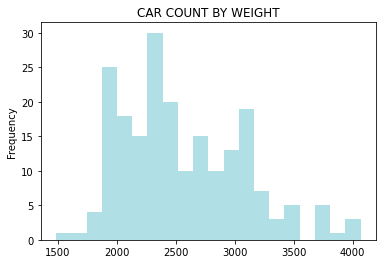

In [37]:
car_p['curbweight'].plot(kind='hist',color='powderblue',figsize=[6,4],title='CAR COUNT BY WEIGHT', bins=20)

# enginetype

In [38]:
eng_type= car_p.groupby(['enginetype'])['enginetype'].count()
print(eng_type)

enginetype
dohc      12
dohcv      1
l         12
ohc      148
ohcf      15
ohcv      13
rotor      4
Name: enginetype, dtype: int64


<AxesSubplot:title={'center':'CAR COUNT BY ENGINETYPE'}, xlabel='enginetype'>

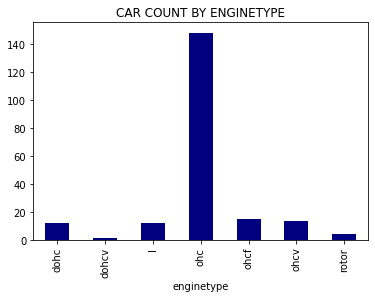

In [39]:
eng_type.plot(kind='bar',color='navy',figsize=[6,4],title='CAR COUNT BY ENGINETYPE')

# cylindernumber

In [40]:
cyl_num= car_p.groupby(['cylindernumber'])['cylindernumber'].count()
print(cyl_num)

cylindernumber
eight       5
five       11
four      159
six        24
three       1
twelve      1
two         4
Name: cylindernumber, dtype: int64


<AxesSubplot:title={'center':'CAR COUNT BY CYLINDER NUMBER'}, xlabel='cylindernumber'>

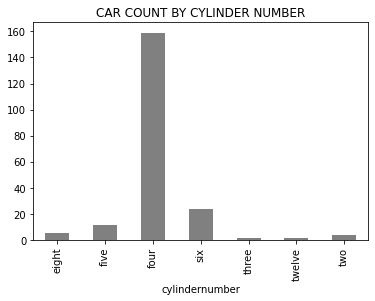

In [41]:
cyl_num.plot(kind='bar',color='grey',figsize=[6,4],title='CAR COUNT BY CYLINDER NUMBER')

# enginesize

In [42]:
car_p['enginesize'].describe()

count    205.000000
mean     126.907317
std       41.642693
min       61.000000
25%       97.000000
50%      120.000000
75%      141.000000
max      326.000000
Name: enginesize, dtype: float64

<AxesSubplot:title={'center':'CAR COUNT BY ENGINE SIZE'}, ylabel='Frequency'>

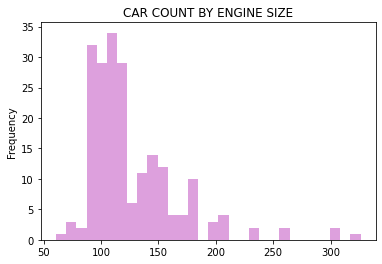

In [43]:
car_p['enginesize'].plot(kind='hist',bins = 30,color='plum',figsize=[6,4],title='CAR COUNT BY ENGINE SIZE')

# fuelsystem  

In [44]:
fuel_sys= car_p.groupby(['fuelsystem'])['fuelsystem'].count()
print(fuel_sys)

fuelsystem
1bbl    11
2bbl    66
4bbl     3
idi     20
mfi      1
mpfi    94
spdi     9
spfi     1
Name: fuelsystem, dtype: int64


[Text(0.5, 1.0, 'CAR COUNT BY FUELSYSTEM')]

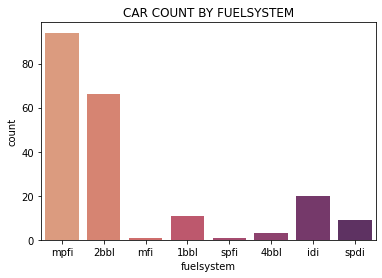

In [45]:
sns.countplot(x='fuelsystem',data=car_p, palette='flare', ).set(title='CAR COUNT BY FUELSYSTEM')

# boreratio 

In [46]:
car_p['boreratio'].describe()

count    205.000000
mean       3.329756
std        0.270844
min        2.540000
25%        3.150000
50%        3.310000
75%        3.580000
max        3.940000
Name: boreratio, dtype: float64

<AxesSubplot:xlabel='boreratio', ylabel='Count'>

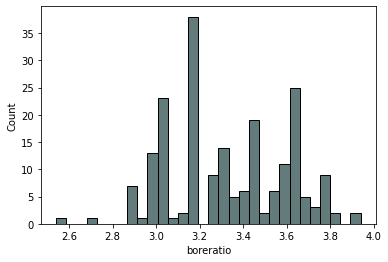

In [47]:
sns.histplot(car_p['boreratio'], bins=30, color='darkslategray')

# stroke 

In [48]:
car_p['stroke'].describe()

count    205.000000
mean       3.255415
std        0.313597
min        2.070000
25%        3.110000
50%        3.290000
75%        3.410000
max        4.170000
Name: stroke, dtype: float64

<AxesSubplot:title={'center':'CAR COUNT BY STROKES'}, ylabel='Frequency'>

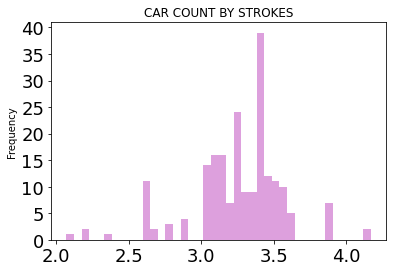

In [49]:
car_p['stroke'].plot(kind='hist',bins = 40,color='plum',
figsize=[6,4],title='CAR COUNT BY STROKES',fontsize=18)

# compressionratio

In [50]:
car_p['compressionratio'].describe()

count    205.000000
mean      10.142537
std        3.972040
min        7.000000
25%        8.600000
50%        9.000000
75%        9.400000
max       23.000000
Name: compressionratio, dtype: float64

<AxesSubplot:ylabel='Frequency'>

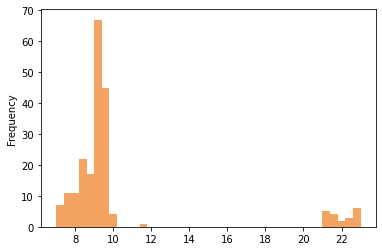

In [51]:
car_p['compressionratio'].plot(kind='hist',bins = 40, figsize=[6,4],color='sandybrown')

In [52]:
car_p['horsepower'].describe()

count    205.000000
mean     104.117073
std       39.544167
min       48.000000
25%       70.000000
50%       95.000000
75%      116.000000
max      288.000000
Name: horsepower, dtype: float64

# horsepower

<AxesSubplot:ylabel='Frequency'>

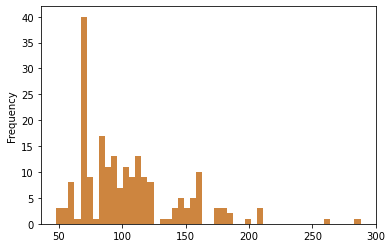

In [53]:
car_p['horsepower'].plot(kind='hist',bins=50, figsize=[6,4],color='peru')

# peakrpm

In [54]:
car_p['peakrpm'].describe()

count     205.000000
mean     5125.121951
std       476.985643
min      4150.000000
25%      4800.000000
50%      5200.000000
75%      5500.000000
max      6600.000000
Name: peakrpm, dtype: float64

<AxesSubplot:ylabel='Frequency'>

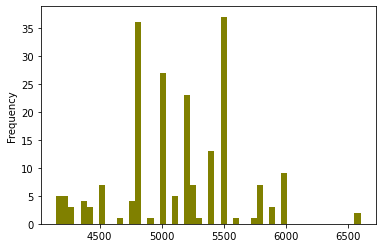

In [55]:
car_p['peakrpm'].plot(kind='hist',color='olive',bins=50, figsize=[6,4])

# citympg

In [56]:
car_p['citympg'].describe()

count    205.000000
mean      25.219512
std        6.542142
min       13.000000
25%       19.000000
50%       24.000000
75%       30.000000
max       49.000000
Name: citympg, dtype: float64

<AxesSubplot:ylabel='Frequency'>

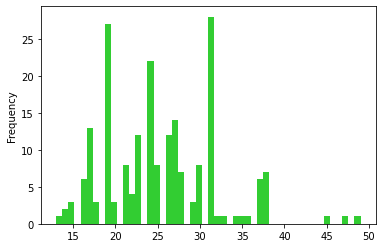

In [57]:
car_p['citympg'].plot(kind='hist',color='limegreen',bins=50, figsize=[6,4])

# highwaympg

In [58]:
car_p['highwaympg'].describe()

count    205.000000
mean      30.751220
std        6.886443
min       16.000000
25%       25.000000
50%       30.000000
75%       34.000000
max       54.000000
Name: highwaympg, dtype: float64

<AxesSubplot:ylabel='Frequency'>

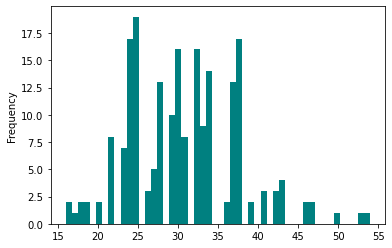

In [59]:
car_p['highwaympg'].plot(kind='hist',color='teal',bins=50, figsize=[6,4])

# price 

In [60]:
car_p['price'].describe()

count      205.000000
mean     13276.710571
std       7988.852332
min       5118.000000
25%       7788.000000
50%      10295.000000
75%      16503.000000
max      45400.000000
Name: price, dtype: float64

<AxesSubplot:ylabel='Frequency'>

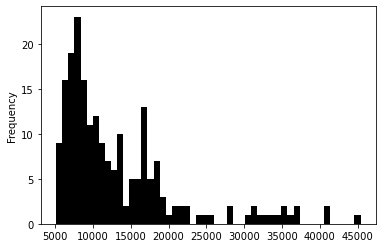

In [61]:
car_p['price'].plot(kind='hist',color='k',bins=50, figsize=[6,4])

# 

# 2. Bivariate Analysis

 Bivariate data analysis is also one of the simplest forms of quantitative analysis. basically, it involves the analysis of
two or more variables, for the purpose of determining the empirical relationship between them.The relationship can also
be visualize using dotplots, lineplots, jointplots and so on. It can also be presented by the use of tables.

The focus of this research work is to dicover those factors that affect the pricing of cars in Nigeria. In the bivariate analysis, we try as much as possible to relate most of the variables to the price variable.  The section starts with analyzing categorical data before the numeric.

## Car Price base on Insurance Symboling

In [62]:
print(car_p.groupby(['symboling','price'])['price'].count())

symboling  price  
-1         8921.0     2
           8948.0     1
           9279.0     1
           9988.0     1
           10698.0    1
                     ..
3          22018.0    1
           32528.0    1
           34028.0    1
           35056.0    1
           37028.0    1
Name: price, Length: 196, dtype: int64


[Text(0.5, 1.0, 'CAR PRICE BASE ON INSURANCE SYMBOL')]

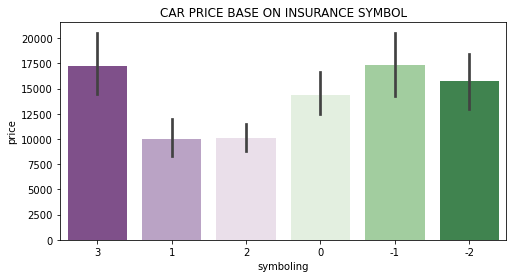

In [63]:
plt.figure(figsize=[8,4])
sns.barplot(x="symboling", y="price",data=car_p,palette="PRGn").set(title='CAR PRICE BASE ON INSURANCE SYMBOL')

## Car price base on fueltype

In [64]:
car_p.groupby(['fueltype','price'])['price'].count()

fueltype  price  
diesel    7099.0     1
          7775.0     1
          7788.0     1
          7898.0     1
          7995.0     1
                    ..
gas       36880.0    1
          37028.0    1
          40960.0    1
          41315.0    1
          45400.0    1
Name: price, Length: 191, dtype: int64

[Text(0.5, 1.0, 'CAR PRICE BASE ON FUEL TYPE')]

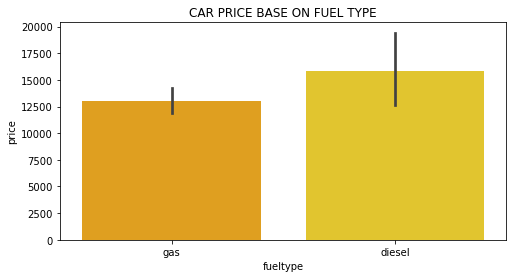

In [65]:
plt.figure(figsize=[8,4])
sns.barplot(x="fueltype", y="price",data=car_p,palette="Wistia_r").set(title='CAR PRICE BASE ON FUEL TYPE')

## Car price base on aspiration

In [66]:
car_p.groupby(['aspiration','price'])['price'].count()

aspiration  price  
std         5118.0     1
            5151.0     1
            5195.0     1
            5348.0     1
            5389.0     1
                      ..
turbo       23875.0    1
            25552.0    1
            28176.0    1
            28248.0    1
            31600.0    1
Name: price, Length: 190, dtype: int64

[Text(0.5, 1.0, 'CAR PRICE BASE ON ASPIRATION')]

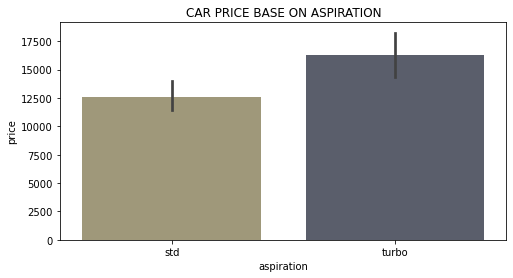

In [67]:
plt.figure(figsize=[8,4])
sns.barplot(x="aspiration", y="price",data=car_p,palette="cividis_r").set(title='CAR PRICE BASE ON ASPIRATION')

## Car price base on door number

In [68]:
car_p.groupby(['doornumber','price'])['price'].count()

doornumber  price  
four        6229.0     2
            6488.0     1
            6575.0     1
            6692.0     2
            6695.0     1
                      ..
two         35056.0    1
            36000.0    1
            37028.0    1
            41315.0    1
            45400.0    1
Name: price, Length: 193, dtype: int64

[Text(0.5, 1.0, 'CAR PRICE BASE ON DOORNUMBER')]

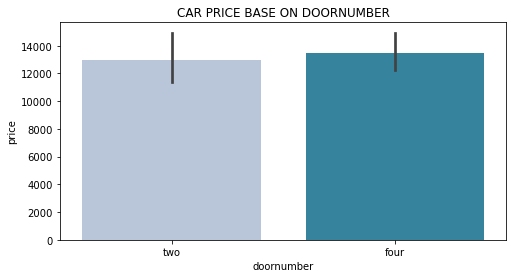

In [69]:
plt.figure(figsize=[8,4])
sns.barplot(x="doornumber", y="price",data=car_p,palette="PuBuGn").set(title='CAR PRICE BASE ON DOORNUMBER')

## Car price base on car body

In [70]:
car_p.groupby(['carbody','price'])['price'].count()

carbody      price  
convertible  11595.0    1
             13495.0    1
             16500.0    1
             17669.0    1
             35056.0    1
                       ..
wagon        16695.0    1
             17075.0    1
             18920.0    1
             18950.0    1
             28248.0    1
Name: price, Length: 194, dtype: int64

[Text(0.5, 1.0, 'CAR PRICE BASE ON CARBODY')]

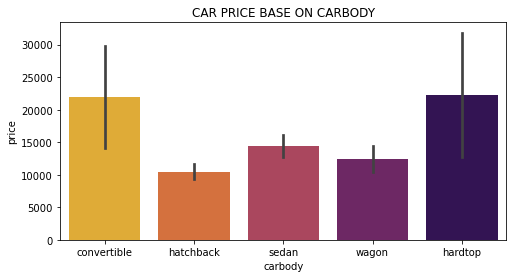

In [71]:
plt.figure(figsize=[8,4])
sns.barplot(x="carbody", y="price",data=car_p,palette="inferno_r").set(title='CAR PRICE BASE ON CARBODY')

## Car Price Base On Drive wheel

In [72]:
car_p.groupby(['drivewheel','price'])['price'].count()

drivewheel  price  
4wd         7603.0     1
            7898.0     1
            8013.0     1
            8778.0     1
            9233.0     1
                      ..
rwd         36880.0    1
            37028.0    1
            40960.0    1
            41315.0    1
            45400.0    1
Name: price, Length: 191, dtype: int64

[Text(0.5, 1.0, 'CAR PRICE BASE ON DRIEVEWHEEL')]

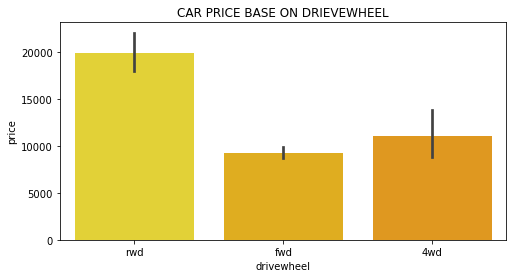

In [73]:
plt.figure(figsize=[8,4])
sns.barplot(x="drivewheel", y="price",data=car_p,palette="Wistia").set(title='CAR PRICE BASE ON DRIEVEWHEEL')

## Car Price Base On enginelocation 

In [74]:
car_p.groupby(['enginelocation'])['price'].count()

enginelocation
front    202
rear       3
Name: price, dtype: int64

[Text(0.5, 1.0, 'CAR PRICE BASE ON ENGINE LOCATION')]

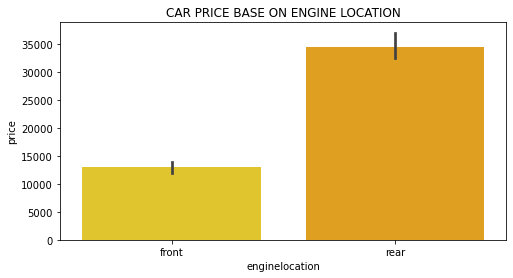

In [75]:
plt.figure(figsize=[8,4])
sns.barplot(x='enginelocation', y="price",data=car_p,palette="Wistia").set(title='CAR PRICE BASE ON ENGINE LOCATION')

## Car Price Base On Engine type 

In [76]:
car_p.groupby(['enginetype','price'])['price'].count() 

enginetype  price  
dohc        9298.0     1
            9538.0     1
            13495.0    1
            15690.0    1
            15750.0    1
                      ..
ohcv        45400.0    1
rotor       10945.0    1
            11845.0    1
            13645.0    1
            15645.0    1
Name: price, Length: 192, dtype: int64

[Text(0.5, 1.0, 'CAR PRICE BASE ON ENGINE TYPE')]

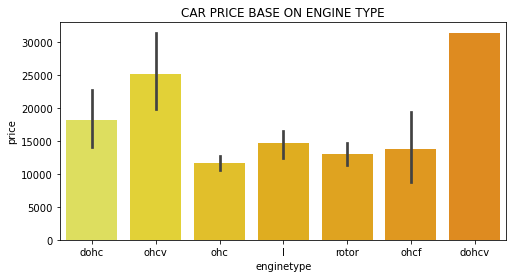

In [77]:
plt.figure(figsize=[8,4])
sns.barplot(x='enginetype', y="price",data=car_p,palette="Wistia").set(title='CAR PRICE BASE ON ENGINE TYPE')

## Car Price by cylindernumber

In [78]:
car_p.groupby(['cylindernumber','price'])['price'].count()

cylindernumber  price  
eight           31400.5    1
                34184.0    1
                35056.0    1
                40960.0    1
                45400.0    1
                          ..
twelve          36000.0    1
two             10945.0    1
                11845.0    1
                13645.0    1
                15645.0    1
Name: price, Length: 190, dtype: int64

[Text(0.5, 1.0, 'CAR PRICE BASE ON CYLINDER NUMBER')]

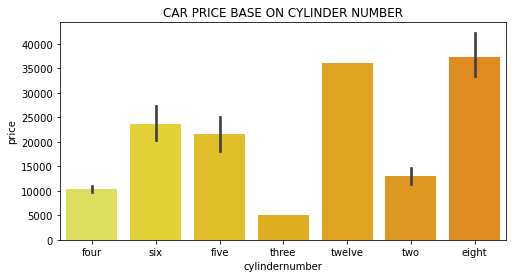

In [79]:
plt.figure(figsize=[8,4])
sns.barplot(x='cylindernumber', y="price",data=car_p,palette="Wistia").set(title='CAR PRICE BASE ON CYLINDER NUMBER')

## Car Price By fuelsystem

In [80]:
car_p.groupby(['fuelsystem','price'])['price'].count()

fuelsystem  price  
1bbl        5399.0     1
            6479.0     1
            6529.0     1
            6855.0     1
            7129.0     1
                      ..
spdi        12629.0    1
            12764.0    1
            14489.0    1
            14869.0    1
spfi        11048.0    1
Name: price, Length: 194, dtype: int64

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'mpfi'),
  Text(1, 0, '2bbl'),
  Text(2, 0, 'mfi'),
  Text(3, 0, '1bbl'),
  Text(4, 0, 'spfi'),
  Text(5, 0, '4bbl'),
  Text(6, 0, 'idi'),
  Text(7, 0, 'spdi')])

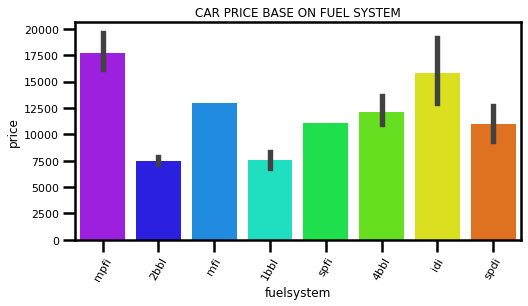

In [81]:
sns.set_context('poster',font_scale=0.5)
plt.figure(figsize=[8,4])
sns.barplot(x='fuelsystem', y="price",data=car_p,palette="gist_rainbow_r").set(title='CAR PRICE BASE ON FUEL SYSTEM')
plt.xticks(rotation= 60)

<AxesSubplot:xlabel='aspiration', ylabel='price'>

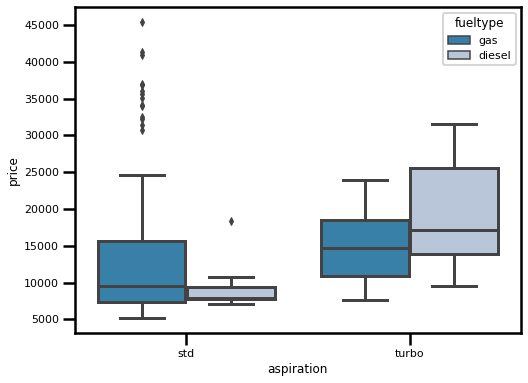

In [82]:
plt.figure(figsize=[8,6])
sns.boxplot(x="aspiration", y="price", hue="fueltype",data=car_p, palette="PuBu_r")

<AxesSubplot:xlabel='drivewheel', ylabel='price'>

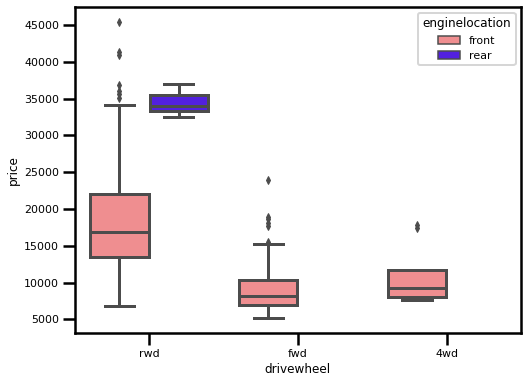

In [83]:
plt.figure(figsize=[8,6])
sns.boxplot(x="drivewheel", y="price", hue="enginelocation",data=car_p, palette="gnuplot2_r")

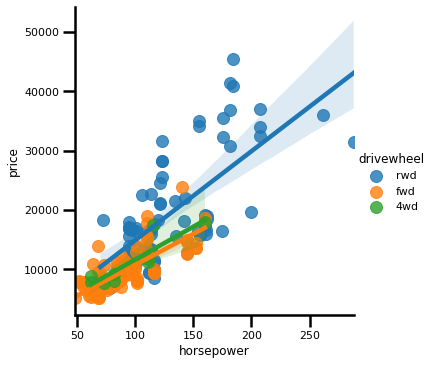

In [84]:
sns.lmplot(x='horsepower',y='price',data=car_p,hue='drivewheel')

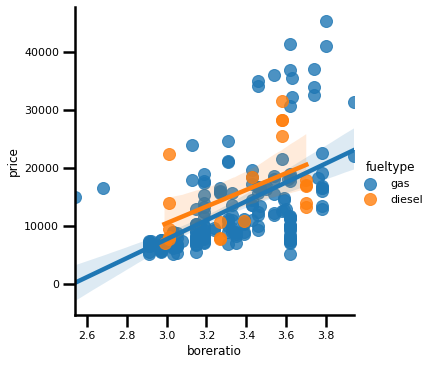

In [85]:
sns.lmplot(x='boreratio',y='price',data=car_p, hue='fueltype')

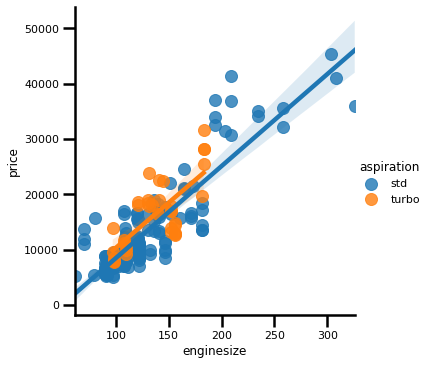

In [86]:
sns.lmplot(x='enginesize',y='price',data=car_p, hue='aspiration')

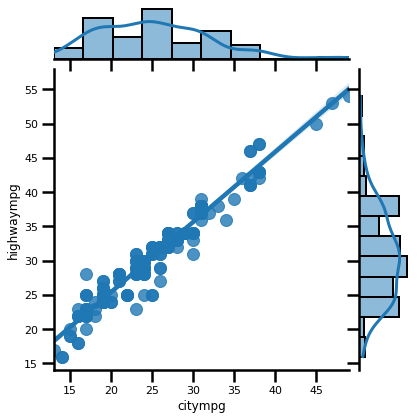

In [87]:
sns.jointplot(x='citympg',y='highwaympg',data=car_p,kind='reg', palette='gist_rainbow_r')

# MULTIVARIATE ANALYSIS

 The multivariate analysis is the simultaneous observation and analysis of more than one outcome variable. Multivariate  
statistics concerns the understanding of the different aims and background of each of the different features of data, 
and how they relate to each other.We try to relate the numeric variables by correlating them in order to determine the levels of relatioships between each one and others.

## The heatmap

<AxesSubplot:>

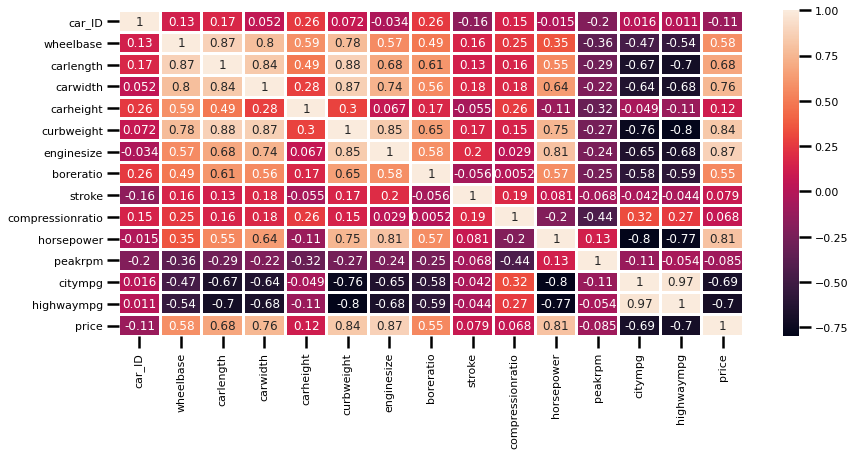

In [88]:
plt.figure(figsize=(14,6))
sns.heatmap(car_p.corr(),annot=True,linecolor='w',linewidth=2)

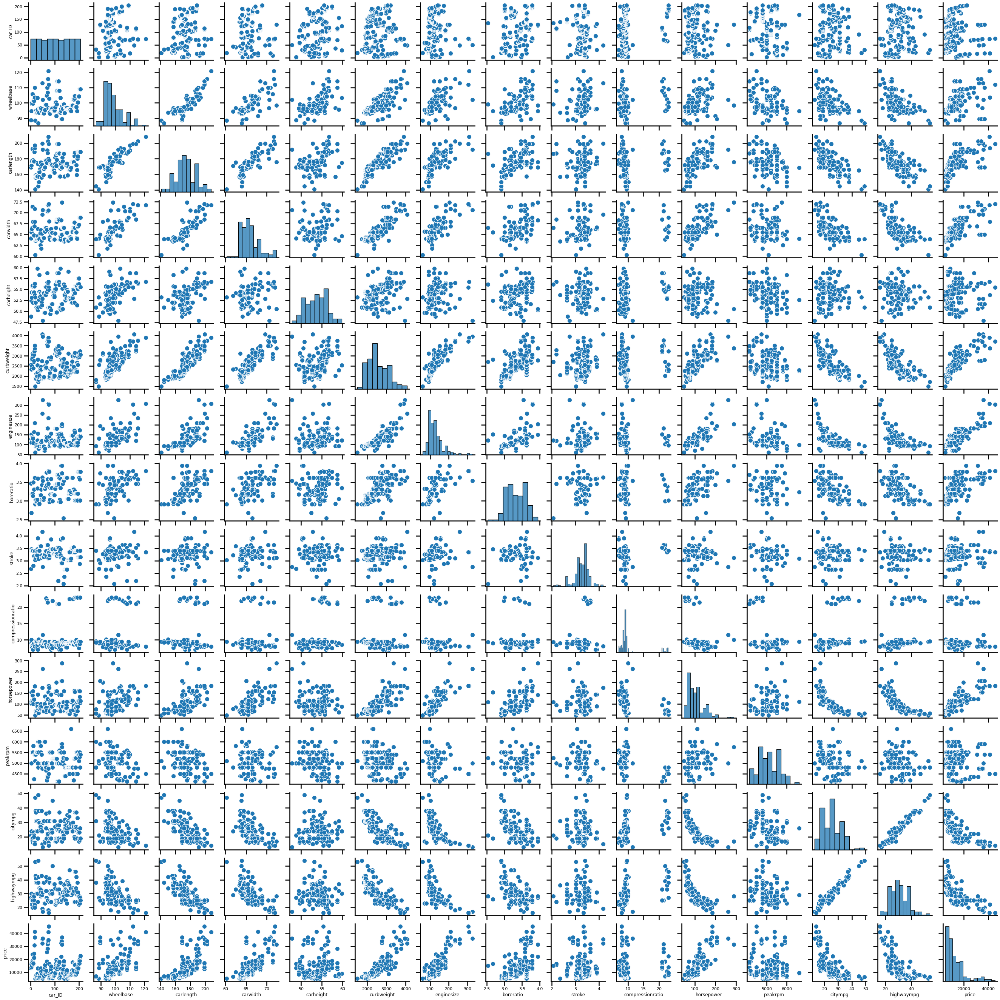

In [89]:
sns.pairplot(car_p, palette='coolwarm')

# Data pre-processing

## 1. feature selection

in this method, you filter and take only the subset of the relevant features. The model is built after selecting the features. 
The filtering here is done using correlation matrix and it is most commonly done using Pearson correlation. A threshhold of 0.5
or -0.5 was set as a filter level, where we pick the absolute relevant features of the dataset that have strong correlation to the 
target variable.

In [90]:
corr = car_p.corr()

In [91]:
# we firstly correlate the target feature with others to determine the strength of relationships
# the second line here  selects those feartures that have levels of correlation above 0.5
target_cor = abs(corr["price"])
selected_features = target_cor[target_cor>0.5]

<AxesSubplot:>

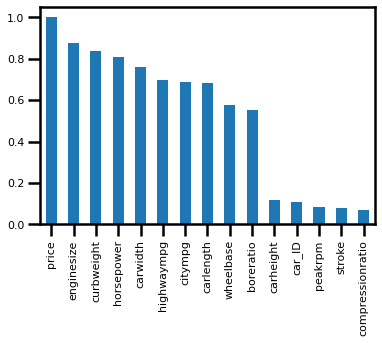

In [92]:
# visualiztion of the correlation
target_cor.nlargest(16).plot.bar()

In [93]:
# selected features base on the 0.5 threshold
selected_features

wheelbase     0.577816
carlength     0.682920
carwidth      0.759325
curbweight    0.835305
enginesize    0.874145
boreratio     0.553173
horsepower    0.808139
citympg       0.685751
highwaympg    0.697599
price         1.000000
Name: price, dtype: float64

In [94]:
#dropping the unselected features 
car_p=car_p.drop(['car_ID','CarName','stroke','compressionratio','peakrpm'], axis=1)

## 2. Handling Outliers

In dealing with the outliers, we selected the numeric value from the dataframe(car_p). 
it was found that not all the numeric variables have outliers.

### Identifying outliers

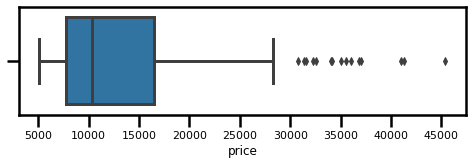

In [95]:
# start by visualizing the target variable, using boxplot
with warnings.catch_warnings(record=True):
    plt.figure(figsize=(8,2))
    sns.boxplot(car_p['price'],)

<AxesSubplot:>

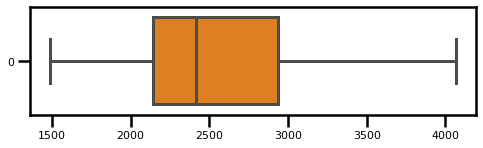

In [96]:
#the independent variables'curweight' has no outliers
plt.figure(figsize=(8,2))
sns.boxplot(data=car_p['curbweight'], palette='afmhot_r', orient='h')

<AxesSubplot:>

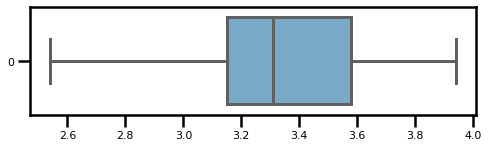

In [97]:
#the independent variables 'boreratio' also has no outliers
plt.figure(figsize=(8,2))
sns.boxplot(data=car_p['boreratio'], palette='Blues',orient='h')

<AxesSubplot:>

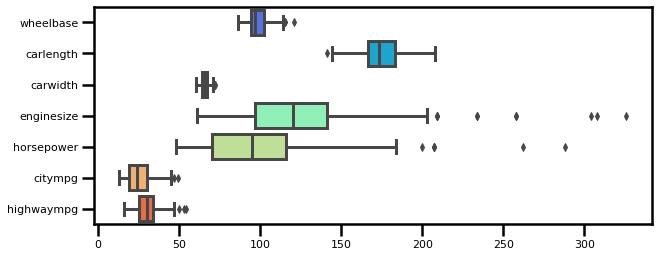

In [98]:
#this group of independent variables have outliers
plt.figure(figsize=(10,4))
sns.boxplot(data=car_p[['wheelbase','carlength','carwidth','enginesize','horsepower','citympg','highwaympg']],
    palette='rainbow',orient='h')

#### using the capping method to replace the outliers

In [99]:
# the following are the numeric features were treated for outliers
cols = car_p[['wheelbase','carlength','carwidth','curbweight','enginesize',
              'boreratio','horsepower','citympg','highwaympg','price']]

In [100]:
#the pandas .quantile() method was used
q1 = cols.quantile(0.25)
q3 = cols.quantile(0.75)
iqr = q3 - q1
lower_limit = q1 - 1.5 * iqr
upper_limit = q3 + 1.5 * iqr

In [101]:
#we use the numpy .where() function to apply the limits to the features
df = np.where(cols > upper_limit,upper_limit, np.where(cols < lower_limit,lower_limit,cols))

In [102]:
#columns to the numpy array normalized data
cols = ['wheelbase','carlength','carwidth','curbweight','enginesize','boreratio','horsepower','citympg','highwaympg','price']

In [103]:
# tranforming the data back to a dataframe
df1 = pd.DataFrame(df)

In [104]:
#Replaced the columns
df1.columns = cols

As we can clearly see, the outliers have been taken care good of


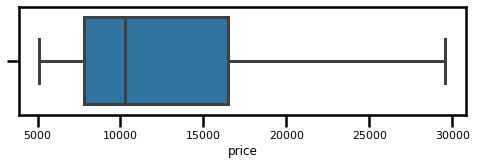

In [105]:
#visualize the dependent variable
with warnings.catch_warnings(record=True):
    plt.figure(figsize=(8,2))
    sns.boxplot(df1['price'])
print('As we can clearly see, the outliers have been taken care good of')

All other numeric dependent variables' outliers have been handled


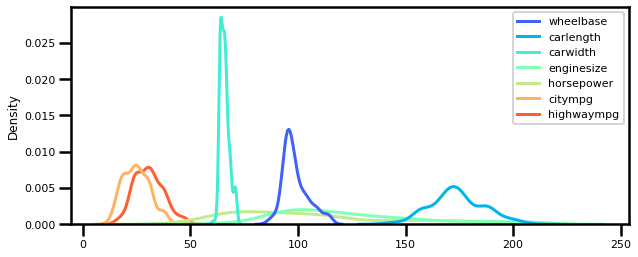

In [106]:
plt.figure(figsize=(10,4))
sns.kdeplot(data=df1[['wheelbase','carlength','carwidth','enginesize',
                      'horsepower','citympg','highwaympg']],
    palette='rainbow')
print("All other numeric dependent variables' outliers have been handled")

## 3.Feature encoding

The feature ecoding is applied to transform categorical data into dummy or indicator variables. Here , we used pd.get_dmmies, 
a pandas library to convert the data set.

In [107]:
# encoding the catgorical variables
cat = car_p[['symboling','fueltype','aspiration','doornumber','carbody',
             'drivewheel','enginelocation','enginetype','cylindernumber','fuelsystem']]

In [108]:
df2 = pd.get_dummies(cat,drop_first=True)

In [109]:
# this is the final preprocessed dataframe we used to build the prediction model
final_car_p = pd.concat([df2,df1],axis = 1)

In [110]:
final_car_p.tail()

,symboling_-2,symboling_0,symboling_1,symboling_2,symboling_3,fueltype_gas,aspiration_turbo,doornumber_two,carbody_hardtop,carbody_hatchback,...,wheelbase,carlength,carwidth,curbweight,enginesize,boreratio,horsepower,citympg,highwaympg,price
200,0,0,0,0,0,1,0,0,0,0,...,109.1,188.8,68.9,2952.0,141.0,3.78,114.0,23.0,28.0,16845.0
201,0,0,0,0,0,1,1,0,0,0,...,109.1,188.8,68.8,3049.0,141.0,3.78,160.0,19.0,25.0,19045.0
202,0,0,0,0,0,1,0,0,0,0,...,109.1,188.8,68.9,3012.0,173.0,3.58,134.0,18.0,23.0,21485.0
203,0,0,0,0,0,0,1,0,0,0,...,109.1,188.8,68.9,3217.0,145.0,3.01,106.0,26.0,27.0,22470.0
204,0,0,0,0,0,1,1,0,0,0,...,109.1,188.8,68.9,3062.0,141.0,3.78,114.0,19.0,25.0,22625.0


# Model building

In [111]:
# importing the necessary libraries
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score,accuracy_score
from sklearn.preprocessing import RobustScaler

### using Linear Regression

In [112]:
# The dependent variabel (y) and the independent variables (x). 
y = final_car_p['price']
x =final_car_p.drop(['price'], axis=1)

In [113]:
#split the data set into train and test sets.
X_train,X_test,Y_train,Y_test = train_test_split(x, y, test_size = 0.3,random_state=0)

In [114]:
X_train.shape, X_test.shape

((143, 43), (62, 43))

In [115]:
Y_train.shape, Y_test.shape

((143,), (62,))

In [116]:
#scaling the dependent variables
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.fit_transform(X_test)

In [117]:
rob_scaler = StandardScaler()
x_train = rob_scaler.fit_transform(X_train)
x_test = rob_scaler.fit_transform(X_test)

In [118]:
r = LinearRegression()
r.fit(X_train,Y_train)
r.score(X_test,Y_test)

0.8993194962322323

In [119]:
r.intercept_

12898.913755244754

In [120]:
r.score(X_train,Y_train)

0.9430576128963049

In [121]:
predictions = r.predict(X_test)

In [122]:
print("Test RMSE:",np.sqrt(mean_squared_error(Y_test,r.predict(X_test))))
print("Train RMSE:",np.sqrt(mean_squared_error(Y_train,r.predict(X_train))))
print("R2 Test:",r2_score(Y_test,r.predict(X_test)))

Test RMSE: 2035.3316903994732
Train RMSE: 1627.2595506199284
R2 Test: 0.8993194962322323


<AxesSubplot:xlabel='price'>

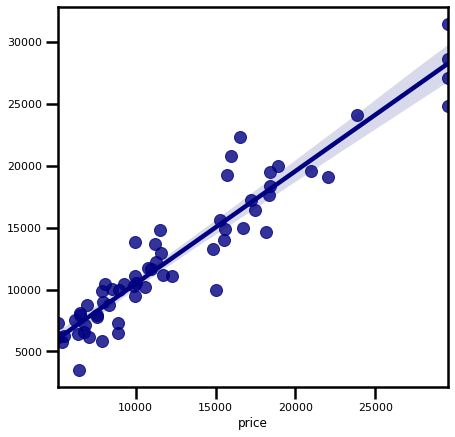

In [123]:
plt.figure(figsize=[7,7])
sns.regplot(x=Y_test,y=predictions, color='navy')

#### USING RIDGE REGRESSION

In [124]:
# fitting the model
rg = Ridge()
rg.fit(X_train,Y_train)
rg.fit(X_train,Y_train)
rg.score(X_test,Y_test)

0.8984840142437539

In [125]:
rg.score(X_train,Y_train)

0.9414641373819109

In [126]:
ridge_preds = rg.predict(X_test)

In [127]:
ridge_preds

array([ 6378.13872487, 19237.8419478 , 15608.16091455,  1909.72562217,
       10818.46396227, 13967.87966556,  6020.88807803,  6648.92451767,
       17826.63615056,  7783.80426799, 19759.94499512, 29165.33147284,
       12515.69849515, 17442.84400109,  7216.52530481, 14713.51868372,
       11208.90626502, 19706.76998268,  9889.55290717,  7393.71810713,
        9493.24369873, 14592.26596057, 10899.16854505, 15512.82848342,
       21013.02602563,  6518.70922229,  8571.84592206, 14722.93903312,
        8319.85966562,  6474.1375176 ,  9648.48121106, 11572.72102799,
       18628.90172087, 10682.33082315,  7108.91383092, 25509.17818156,
       12151.30379649, 14290.47305572,  6213.11841108, 27272.34335096,
        6503.56136787, 16768.35678902, 27376.31379893, 11823.46591561,
       12832.96969208,  7896.95959239,  7663.25980678, 13550.80843461,
       12010.19295629, 10366.62112312, 23638.06549157,  6602.59178255,
       10698.36546597, 10394.06837058, 21812.17494847, 18936.40748093,
      

In [128]:
print("Test RMSE",np.sqrt(mean_squared_error(Y_test,rg.predict(X_test))))
print("Train RMSE",np.sqrt(mean_squared_error(Y_train,rg.predict(X_train))))
print("R2 Test",r2_score(Y_test,rg.predict(X_test)))

Test RMSE 2043.7591895972832
Train RMSE 1649.8710640875688
R2 Test 0.8984840142437539


<AxesSubplot:xlabel='price'>

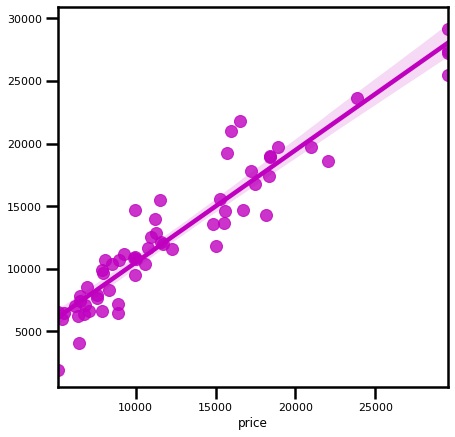

In [129]:
plt.figure(figsize=[7,7])
sns.regplot(x=Y_test,y=ridge_preds, color='m')